Use COCPIT labeled images with matching latest SSL embedings:
- COCPIT labeled data source: /home/vanessa/hulk/cocpit/final_databases/vgg16/v3.1.0 (original path)
- SSL embeddings details: /home/jko/ssl-cpi-analysis/data/SSL-Model-v3/cpi3m_campaign_cls_head_features_compressed.parquet
    - Model version: SSL-Model-v3
    - Embedding space dimensionality: 384

In [1]:
import pandas as pd 
from pathlib import Path
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
cpi3m_path = "/home/jko/ssl-cpi-analysis/data/SSL-Model-v3/cpi3m_campaign_cls_head_features_compressed.parquet"
df_emb = pd.read_parquet(cpi3m_path)
df_emb.head()

,campaign_file_id,cls_features,campaign,filename,head_features
0,AIRS_II/1114-115708_753_18.png,"[-1.5736805, -1.3467796, 0.04833835, 0.3916099...",AIRS_II,1114-115708_753_18.png,"[-0.17437246, 0.2200682, 0.10603274, -0.056715..."
1,AIRS_II/1114-115708_753_25.png,"[-0.66408825, -0.6209793, 0.1612174, 1.3233154...",AIRS_II,1114-115708_753_25.png,"[0.15088466, 0.08699661, 0.14878878, 0.1028433..."
2,AIRS_II/1114-115708_753_35.png,"[1.1819375, -2.4165041, -0.30923426, 1.14031, ...",AIRS_II,1114-115708_753_35.png,"[0.00860272, 0.2842432, 0.08453432, -0.0037056..."
3,AIRS_II/1114-115708_753_4.png,"[1.4077586, -2.7799225, -0.009916204, 2.860191...",AIRS_II,1114-115708_753_4.png,"[-0.098591514, 0.049973477, 0.09828363, 0.0882..."
4,AIRS_II/1114-115745_814_121.png,"[0.78316724, -2.2493873, 1.3674333, 1.6577381,...",AIRS_II,1114-115745_814_121.png,"[-0.04227246, -0.12237781, 0.11841022, 0.04170..."


In [3]:
print(f"Memory usage: {df_emb.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

Memory usage: 1411.52 MB


In [109]:
# dimensionality of embeddings
cls_dim = len(df_emb['cls_features'].iloc[0])
head_dim = len(df_emb['head_features'].iloc[0])

print("Dimensionality of cls_features:", cls_dim)
print("Dimensionality of head_features:", head_dim)

Dimensionality of cls_features: 384
Dimensionality of head_features: 64


In [4]:
# number of unique campaings in embeddings df 
print(f'There are {len(df_emb.campaign.unique())} unique campaigns in embeddings df.')
df_emb.campaign.unique()

There are 12 unique campaigns in embeddings df.


array(['AIRS_II', 'ARM', 'ATTREX', 'CRYSTAL_FACE_NASA',
       'CRYSTAL_FACE_UND', 'ICE_L', 'IPHEX', 'ISDAC', 'MACPEX', 'MC3E',
       'MIDCIX', 'MPACE'], dtype=object)

In [5]:
# Count number of samples per campaign
samples_per_campaign = df_emb['campaign'].value_counts().sort_index()
print(samples_per_campaign)

campaign
AIRS_II                92201
ARM                   295703
ATTREX                129128
CRYSTAL_FACE_NASA      78152
CRYSTAL_FACE_UND     1617826
ICE_L                  46236
IPHEX                  40692
ISDAC                 505812
MACPEX                 80240
MC3E                  187558
MIDCIX                 90761
MPACE                  36042
Name: count, dtype: int64


In [93]:
# # load COCPIT labeled dataset 

# # -------------------------------
# # Parameters
# # -------------------------------
# data_dir = '/home/jko/cocpit/final_databases/vgg16/jk-modified'
# label_col = 'classification'  # original column name

# # -------------------------------
# # Step 1: Find all CSV files
# # -------------------------------
# csv_files = list(Path(data_dir).glob('*.csv'))
# if not csv_files:
#     raise FileNotFoundError(f"No CSV files found in {data_dir}")

# # -------------------------------
# # Step 2: Find columns common to all CSVs
# # -------------------------------
# cols_by_file = [set(pd.read_csv(f, nrows=0).columns) for f in csv_files]
# common_cols = sorted(set.intersection(*cols_by_file))
# print(f"Common columns ({len(common_cols)}): {common_cols}")

# # -------------------------------
# # Step 3: Load each CSV, assign campaign, and concatenate
# # -------------------------------
# dfs = []
# for f in csv_files:
#     tmp = pd.read_csv(f, usecols=common_cols)
#     tmp["campaign"] = f.stem  # assign campaign based on file
#     dfs.append(tmp)

# df = pd.concat(dfs, ignore_index=True)
# print(f"\nCombined DataFrame shape: {df.shape}")

# # -------------------------------
# # Step 4: Canonicalize classification labels (replace original column)
# # -------------------------------
# LABEL_MAP = {
#     # aggregates
#     "aggregate": "aggregate",
#     "agg": "aggregate",

#     # compact irregular
#     "compact irregular": "compact_irregular",
#     "compact_irreg": "compact_irregular",

#     # planar polycrystal
#     "planar polycrystal": "planar_polycrystal",
#     "planar_polycrystal": "planar_polycrystal",

#     # bullet rosettes
#     "bullet rosette": "bullet_rosette",
#     "bullet": "bullet_rosette",

#     # budding rosettes
#     "budding rosette": "budding_rosette",
#     "budding": "budding_rosette",

#     # already canonical
#     "sphere": "sphere",
#     "column": "column",
#     "fragment": "fragment",
#     "rimed": "rimed",
# }

# # Replace the original classification column with cleaned labels
# df[label_col] = df[label_col].str.lower().map(LABEL_MAP)

# # -------------------------------
# # Step 5: Sanity checks
# # -------------------------------
# print("\nFinal label counts:")
# print(df[label_col].value_counts())

# unmapped = df.loc[df[label_col].isna(), label_col].unique()
# if len(unmapped) > 0:
#     print("\n⚠️ Unmapped labels found:")
#     print(unmapped)
# else:
#     print("\n✅ All labels successfully mapped")

# # -------------------------------
# # Step 6: Done
# # -------------------------------
# print("\nDataFrame ready with cleaned classification labels and correct campaign assignment:")
# print(df.head())

# # -------------------------------
# # Step 7: Count number of samples per campaign (optional)
# # -------------------------------
# samples_per_campaign = df["campaign"].value_counts()
# print("\nNumber of samples per campaign:")
# print(samples_per_campaign)

# # create df for cocpit 
# df_cocpit = df

In [91]:
# TESTING 
from pathlib import Path
import pandas as pd

# -------------------------------
# Parameters
# -------------------------------
data_dir = '/home/jko/cocpit/final_databases/vgg16/jk-modified'
label_col = 'classification'
features_to_find = ['particle width', 'particle height']  # base strings to search

# -------------------------------
# Step 1: Find all CSV files
# -------------------------------
csv_files = list(Path(data_dir).glob('*.csv'))
if not csv_files:
    raise FileNotFoundError(f"No CSV files found in {data_dir}")

# -------------------------------
# Step 2: Identify columns robustly
# -------------------------------
# Read headers only
cols_by_file = [pd.read_csv(f, nrows=0).columns for f in csv_files]

# Normalize columns
cols_by_file_norm = [[c.lower().strip() for c in cols] for cols in cols_by_file]

# Columns common to all CSVs (ignoring case/whitespace)
common_cols_norm = set(cols_by_file_norm[0])
for cols in cols_by_file_norm[1:]:
    common_cols_norm &= set(cols)

# Map normalized names back to actual column names from the first CSV
first_csv_cols = cols_by_file[0]
common_cols_actual = [c for c in first_csv_cols if c.lower().strip() in common_cols_norm]

print(f"Common columns loaded ({len(common_cols_actual)}): {common_cols_actual}")

# -------------------------------
# Step 3: Load each CSV, including particle width/height if present
# -------------------------------
dfs = []

for f in csv_files:
    # Read header
    cols = pd.read_csv(f, nrows=0).columns
    # Detect particle width/height columns
    particle_width_col = next((c for c in cols if 'particle width' in c.lower()), None)
    particle_height_col = next((c for c in cols if 'particle height' in c.lower()), None)
    
    # Columns to load: common + detected particle width/height
    cols_to_load = list(common_cols_actual)
    if particle_width_col and particle_width_col not in cols_to_load:
        cols_to_load.append(particle_width_col)
    if particle_height_col and particle_height_col not in cols_to_load:
        cols_to_load.append(particle_height_col)
    
    # Load CSV
    tmp = pd.read_csv(f, usecols=cols_to_load)
    tmp['campaign'] = f.stem  # assign campaign
    dfs.append(tmp)

# Combine all
df = pd.concat(dfs, ignore_index=True)
print(f"\nCombined DataFrame shape: {df.shape}")

# -------------------------------
# Step 4: Canonicalize classification labels
# -------------------------------
LABEL_MAP = {
    "aggregate": "aggregate", "agg": "aggregate",
    "compact irregular": "compact_irregular", "compact_irreg": "compact_irregular",
    "planar polycrystal": "planar_polycrystal", "planar_polycrystal": "planar_polycrystal",
    "bullet rosette": "bullet_rosette", "bullet": "bullet_rosette",
    "budding rosette": "budding_rosette", "budding": "budding_rosette",
    "sphere": "sphere", "column": "column", "fragment": "fragment", "rimed": "rimed",
}

df[label_col] = df[label_col].str.lower().map(LABEL_MAP)

# -------------------------------
# Step 5: Rename particle width/height to canonical names
# -------------------------------
# Pick the first matching column in the DataFrame
particle_width_col = next((c for c in df.columns if 'particle width' in c.lower()), None)
particle_height_col = next((c for c in df.columns if 'particle height' in c.lower()), None)

if particle_width_col:
    df['particle_width'] = df[particle_width_col]
if particle_height_col:
    df['particle_height'] = df[particle_height_col]

print(f"\nColumns after adding particle_width/height: {df.columns.tolist()}")

# -------------------------------
# Step 6: Sanity checks
# -------------------------------
print("\nFinal label counts:")
print(df[label_col].value_counts())

unmapped = df.loc[df[label_col].isna(), label_col].unique()
if len(unmapped) > 0:
    print("\n⚠️ Unmapped labels found:")
    print(unmapped)
else:
    print("\n✅ All labels successfully mapped")

# -------------------------------
# Step 7: Count samples per campaign
# -------------------------------
samples_per_campaign = df['campaign'].value_counts()
print("\nNumber of samples per campaign:")
print(samples_per_campaign)

# -------------------------------
# Step 8: Done
# -------------------------------
df_cocpit = df
print("\nDataFrame ready with particle_width and particle_height added:")
print(df_cocpit.head())

# -------------------------------
# Detect all particle width / height columns
# -------------------------------
particle_width_cols = [c for c in df_cocpit.columns if 'particle width' in c.lower() or 'particle_width' in c.lower()]
particle_height_cols = [c for c in df_cocpit.columns if 'particle height' in c.lower() or 'particle_height' in c.lower()]

print(f"Detected particle width columns: {particle_width_cols}")
print(f"Detected particle height columns: {particle_height_cols}")

# -------------------------------
# Combine into unified columns using first non-null value
# -------------------------------
df_cocpit['particle_width'] = df_cocpit[particle_width_cols].bfill(axis=1).iloc[:, 0]
df_cocpit['particle_height'] = df_cocpit[particle_height_cols].bfill(axis=1).iloc[:, 0]

# -------------------------------
# Drop the original redundant columns
# -------------------------------
df_cocpit = df_cocpit.drop(columns=set(particle_width_cols + particle_height_cols) - set(['particle_width', 'particle_height']))

# -------------------------------
# Check results
# -------------------------------
print("Columns after unification:")
print(df_cocpit.columns)

print("\nCheck particle_width / particle_height data:")
print(df_cocpit[['particle_width', 'particle_height']].head())

Common columns loaded (14): ['filename', 'date', 'classification', 'blur', 'contrast', 'circularity', 'solidity', 'complexity', 'equiv_d', 'phi', 'extreme_points', 'filled_circular_area_ratio', 'roundness', 'perim_area_ratio']

Combined DataFrame shape: (1060926, 19)

Columns after adding particle_width/height: ['filename', 'date', 'particle width [microns]', 'particle height [microns]', 'classification', 'blur', 'contrast', 'circularity', 'solidity', 'complexity', 'equiv_d', 'phi', 'extreme_points', 'filled_circular_area_ratio', 'roundness', 'perim_area_ratio', 'campaign', 'particle width', 'particle height', 'particle_width', 'particle_height']

Final label counts:
classification
compact_irregular     534637
aggregate             214006
planar_polycrystal    102280
rimed                  97693
column                 45193
budding_rosette        33396
bullet_rosette         26617
sphere                  6864
fragment                 240
Name: count, dtype: int64

✅ All labels successf

In [94]:
# print colnames for each df 
print('df_emb colnames...')
print(df_emb.columns.tolist())
print('df_cocpit colnames...')
print(df_cocpit.columns.tolist())

df_emb colnames...
['campaign_file_id', 'cls_features', 'campaign', 'filename', 'head_features']
df_cocpit colnames...
['filename', 'date', 'classification', 'blur', 'contrast', 'circularity', 'solidity', 'complexity', 'equiv_d', 'phi', 'extreme_points', 'filled_circular_area_ratio', 'roundness', 'perim_area_ratio', 'campaign', 'particle_width', 'particle_height']


In [95]:
# Check that campaign names are in the same format 
print('df_emb campaign names...')
print(df_emb.campaign.unique())
print('df_cocpit campaign names...')
print(df_cocpit.campaign.unique())

df_emb campaign names...
['AIRS_II' 'ARM' 'ATTREX' 'CRYSTAL_FACE_NASA' 'CRYSTAL_FACE_UND' 'ICE_L'
 'IPHEX' 'ISDAC' 'MACPEX' 'MC3E' 'MIDCIX' 'MPACE']
df_cocpit campaign names...
['ATTREX' 'OLYMPEX' 'MPACE' 'ICE_L' 'AIRS_II' 'CRYSTAL_FACE_NASA' 'IPHEX'
 'POSIDON' 'MACPEX' 'CRYSTAL_FACE_UND' 'MC3E' 'ARM' 'ISDAC' 'ESCAPE'
 'MIDCIX']


In [96]:
# merge cocpit and embeddings df's 

# Merge df_emb and df_cocpit on 'campaign' and 'filename'
df_merged = pd.merge(
    df_emb,
    df_cocpit,
    on=['campaign', 'filename'],
    how='inner'  # use 'inner' to keep only matching rows
)

print(f"Merged DataFrame shape: {df_merged.shape}")
df_merged.head()

Merged DataFrame shape: (937237, 20)


,campaign_file_id,cls_features,campaign,filename,head_features,date,classification,blur,contrast,circularity,solidity,complexity,equiv_d,phi,extreme_points,filled_circular_area_ratio,roundness,perim_area_ratio,particle_width,particle_height
0,AIRS_II/2003_1114_134317_724_13.png,"[0.2910927, 0.38144028, 1.1725152, -0.4043146,...",AIRS_II,2003_1114_134317_724_13.png,"[0.10949938, 0.06253101, -0.06456344, 0.338093...",2003-11-14 13:43:17,budding_rosette,29.494,87.158,0.383,0.817,0.596,769.296,0.834,330.573,0.571,0.720,0.008,181.132,216.466
1,AIRS_II/2003_1114_134317_724_14.png,"[-0.9387017, 2.2442503, 1.0302829, -1.5016816,...",AIRS_II,2003_1114_134317_724_14.png,"[-0.099237524, -0.072814986, -0.01931724, 0.22...",2003-11-14 13:43:17,budding_rosette,18.941,81.149,0.209,0.742,0.766,738.851,0.894,357.990,0.505,0.640,0.012,161.984,193.049
2,AIRS_II/2003_1114_134317_724_17.png,"[0.26718536, 1.0774301, 0.08947551, -1.1187441...",AIRS_II,2003_1114_134317_724_17.png,"[0.058383655, 0.053461675, -0.071571335, 0.360...",2003-11-14 13:43:17,budding_rosette,27.279,90.875,0.278,0.745,0.687,755.328,0.972,338.392,0.500,0.646,0.010,195.634,199.894
3,AIRS_II/2003_1114_134317_724_18.png,"[-0.81129575, 2.301869, 1.2609062, -0.8582968,...",AIRS_II,2003_1114_134317_724_18.png,"[-0.19895327, -0.09332458, -0.06524665, 0.1968...",2003-11-14 13:43:17,compact_irregular,23.879,89.105,0.272,0.799,0.735,733.868,0.870,303.559,0.668,0.742,0.010,109.099,197.747
4,AIRS_II/2003_1114_134317_724_39.png,"[0.3733411, -1.1279708, -1.072373, -0.79710406...",AIRS_II,2003_1114_134317_724_39.png,"[-0.06219735, 0.20381087, 0.018670687, 0.16595...",2003-11-14 13:43:17,compact_irregular,26.745,90.298,0.315,0.753,0.649,710.312,0.997,325.416,0.508,0.656,0.010,122.374,122.261


In [97]:
# basic count statistics of merged df 
samples_per_campaign = df_merged['campaign'].value_counts().sort_index()
print(samples_per_campaign)

campaign
AIRS_II               27303
ARM                   23959
ATTREX                19637
CRYSTAL_FACE_NASA     61858
CRYSTAL_FACE_UND     396138
ICE_L                 37019
IPHEX                 16900
ISDAC                 73394
MACPEX                 2226
MC3E                 160630
MIDCIX                88857
MPACE                 29316
Name: count, dtype: int64


In [98]:
df_merged.columns.tolist()

['campaign_file_id',
 'cls_features',
 'campaign',
 'filename',
 'head_features',
 'date',
 'classification',
 'blur',
 'contrast',
 'circularity',
 'solidity',
 'complexity',
 'equiv_d',
 'phi',
 'extreme_points',
 'filled_circular_area_ratio',
 'roundness',
 'perim_area_ratio',
 'particle_width',
 'particle_height']

In [99]:
df_merged[df_merged['classification']=='fragment'].shape

(134, 20)

In [13]:
# -------------------------------
# Parameters
# -------------------------------
N = 2000  # number of samples per classification
label_col = "classification"

# -------------------------------
# Step 1: Sample N per classification
# -------------------------------
dfs = []
for cls, group in df_merged.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))

df_small = pd.concat(dfs, ignore_index=True)

# -------------------------------
# Step 2: Check results
# -------------------------------
print(f"df_small shape: {df_small.shape}")
print("\nNumber of samples per classification:")
print(df_small[label_col].value_counts())

df_small shape: (16134, 18)

Number of samples per classification:
classification
aggregate             2000
budding_rosette       2000
bullet_rosette        2000
column                2000
compact_irregular     2000
planar_polycrystal    2000
rimed                 2000
sphere                2000
fragment               134
Name: count, dtype: int64


# Dimensionality Reduction

## PCA

backbone features

In [47]:
# PCA on cls_features

# Extract features as a 2D array
X = np.vstack(df_merged['cls_features'].values)  # shape: (num_samples, num_features)
print("Feature array shape:", X.shape)

N_COMPONENTS = 10  # change to how many PCA components you want

pca = PCA(n_components=N_COMPONENTS, random_state=42)
X_pca = pca.fit_transform(X)

print("PCA-transformed shape:", X_pca.shape)

Feature array shape: (937237, 384)
PCA-transformed shape: (937237, 10)


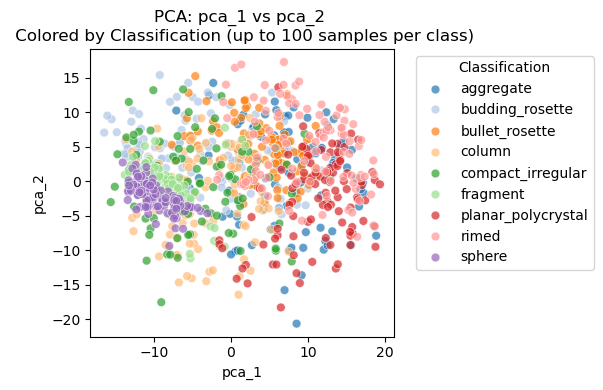

In [19]:
# Build new dataframe
pca_cols = [f"pca_{i+1}" for i in range(N_COMPONENTS)]
df_merged_pca = df_merged.copy()
df_merged_pca[pca_cols] = X_pca

# which PCA components to plot
x_col, y_col = "pca_1", "pca_2"
label_col = "classification"

# -------------------------------
# Subsample up to N per class
# -------------------------------
N = 100  # max samples per class
dfs = []
for cls, group in df_merged_pca.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))

df_plot = pd.concat(dfs, ignore_index=True)

# -------------------------------
# Plot
# -------------------------------
plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df_plot,
    x=x_col,
    y=y_col,
    hue=label_col,
    palette="tab20",
    alpha=0.7,
    s=40
)

plt.title(f"PCA: {x_col} vs {y_col} \n Colored by Classification (up to {N} samples per class)")
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.legend(title="Classification", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


Visualize slices of higher PCA dimensions

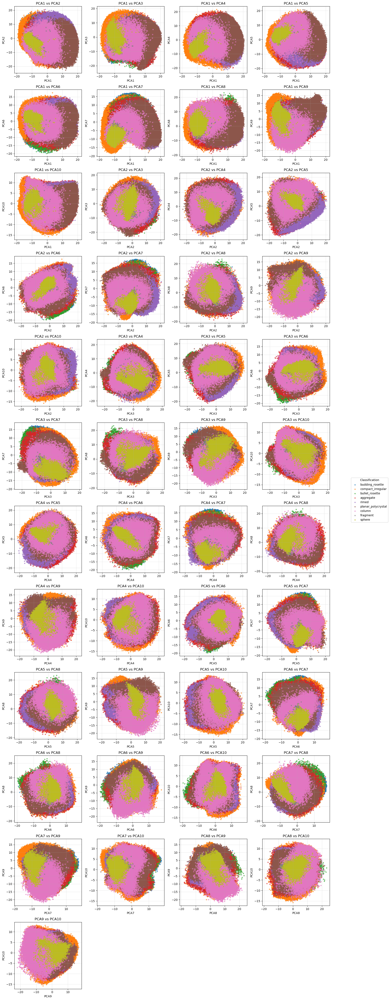

In [48]:
# Create DataFrame for plotting
pca_cols = [f"PCA{i+1}" for i in range(N_COMPONENTS)]
df_pca = pd.DataFrame(X_pca, columns=pca_cols)
df_pca['classification'] = df_merged['classification'].values
import itertools

# List all component pairs
pairs = list(itertools.combinations(pca_cols, 2))
n_pairs = len(pairs)

# Determine grid size
n_cols = 4
n_rows = int(np.ceil(n_pairs / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*4))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(pairs):
    ax = axes[i]
    for cls in df_pca['classification'].unique():
        sub = df_pca[df_pca['classification'] == cls]
        ax.scatter(sub[x_col], sub[y_col], s=10, alpha=0.6, label=cls)
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.grid(alpha=0.3)
    ax.set_title(f"{x_col} vs {y_col}")
    
# Remove unused axes
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Add one legend for all subplots
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, title="Classification", bbox_to_anchor=(1.05, 0.5), loc="center left")

plt.tight_layout()
plt.show()

head features

In [20]:
# PCA on head_features

# Extract features as a 2D array
X = np.vstack(df_merged['head_features'].values)  # shape: (num_samples, num_features)
print("Feature array shape:", X.shape)

N_COMPONENTS = 10  # change to how many PCA components you want

pca = PCA(n_components=N_COMPONENTS, random_state=42)
X_pca = pca.fit_transform(X)

print("PCA-transformed shape:", X_pca.shape)

Feature array shape: (937237, 64)
PCA-transformed shape: (937237, 10)


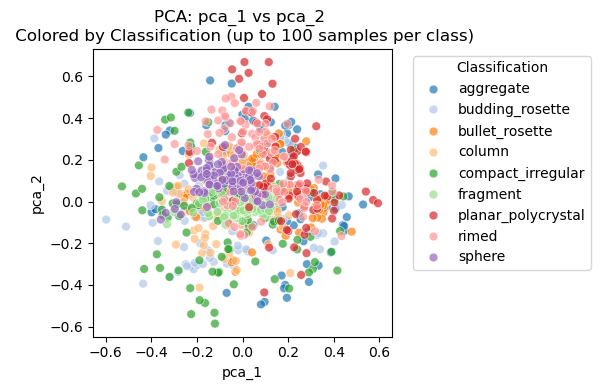

In [21]:
# Build new dataframe
pca_cols = [f"pca_{i+1}" for i in range(N_COMPONENTS)]
df_merged_pca = df_merged.copy()
df_merged_pca[pca_cols] = X_pca

# which PCA components to plot
x_col, y_col = "pca_1", "pca_2"
label_col = "classification"

# -------------------------------
# Subsample up to N per class
# -------------------------------
N = 100  # max samples per class
dfs = []
for cls, group in df_merged_pca.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))

df_plot = pd.concat(dfs, ignore_index=True)

# -------------------------------
# Plot
# -------------------------------
plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df_plot,
    x=x_col,
    y=y_col,
    hue=label_col,
    palette="tab20",
    alpha=0.7,
    s=40
)

plt.title(f"PCA: {x_col} vs {y_col} \n Colored by Classification (up to {N} samples per class)")
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.legend(title="Classification", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


## UMAP

backbone features

Subsampled DataFrame shape: (4134, 18)
Feature array shape (subsampled): (4134, 384)
UMAP-transformed shape: (4134, 2)


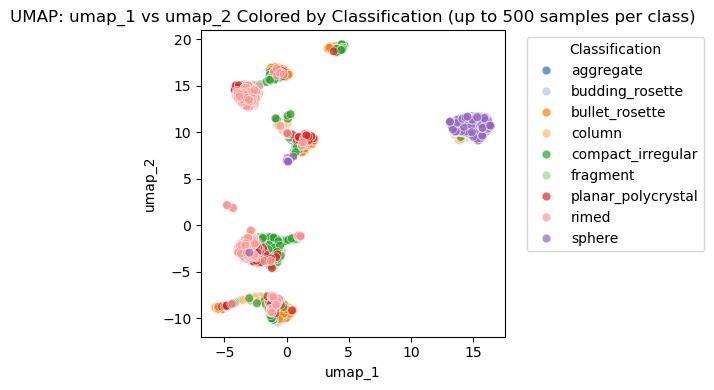

In [22]:
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# Parameters
# -------------------------------
N_COMPONENTS = 2   # for 2D visualization
N = 500            # max samples per class (adjust as needed)
label_col = "classification"
x_col, y_col = "umap_1", "umap_2"

# -------------------------------
# Subsample first to reduce computation
# -------------------------------
dfs = []
for cls, group in df_merged.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))
df_sub = pd.concat(dfs, ignore_index=True)
print(f"Subsampled DataFrame shape: {df_sub.shape}")

# -------------------------------
# Extract features as 2D array
# -------------------------------
X = np.vstack(df_sub['cls_features'].values)
print("Feature array shape (subsampled):", X.shape)

# -------------------------------
# Apply UMAP
# -------------------------------
umap_model = umap.UMAP(
    n_components=N_COMPONENTS,
    n_neighbors=15,
    min_dist=0.1,
    # random_state=42
)

X_umap = umap_model.fit_transform(X)
print("UMAP-transformed shape:", X_umap.shape)

# -------------------------------
# Merge UMAP embedding back into DataFrame
# -------------------------------
umap_cols = [x_col, y_col]
df_sub_umap = df_sub.copy()
df_sub_umap[umap_cols] = X_umap

# -------------------------------
# Plot UMAP 2D scatter
# -------------------------------
plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df_sub_umap,
    x=x_col,
    y=y_col,
    hue=label_col,
    palette="tab20",
    alpha=0.7,
    s=40
)

plt.title(f"UMAP: {x_col} vs {y_col} Colored by Classification (up to {N} samples per class)")
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.legend(title="Classification", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

head features

Subsampled DataFrame shape: (4134, 18)
Feature array shape (subsampled): (4134, 64)
UMAP-transformed shape: (4134, 2)


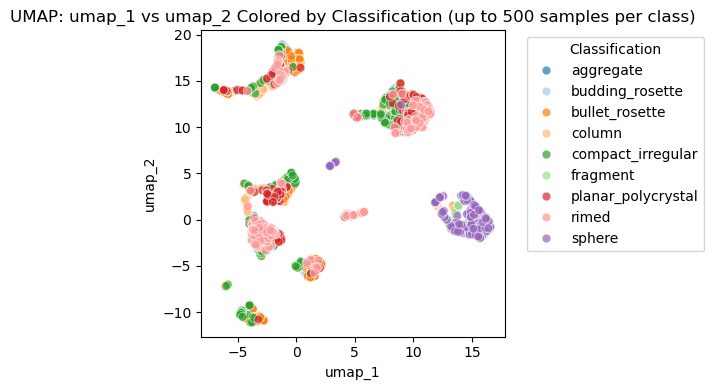

In [23]:
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# Parameters
# -------------------------------
N_COMPONENTS = 2   # for 2D visualization
N = 500            # max samples per class (adjust as needed)
label_col = "classification"
x_col, y_col = "umap_1", "umap_2"

# -------------------------------
# Subsample first to reduce computation
# -------------------------------
dfs = []
for cls, group in df_merged.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))
df_sub = pd.concat(dfs, ignore_index=True)
print(f"Subsampled DataFrame shape: {df_sub.shape}")

# -------------------------------
# Extract features as 2D array
# -------------------------------
X = np.vstack(df_sub['head_features'].values)
print("Feature array shape (subsampled):", X.shape)

# -------------------------------
# Apply UMAP
# -------------------------------
umap_model = umap.UMAP(
    n_components=N_COMPONENTS,
    n_neighbors=15,
    min_dist=0.1,
    # random_state=42
)

X_umap = umap_model.fit_transform(X)
print("UMAP-transformed shape:", X_umap.shape)

# -------------------------------
# Merge UMAP embedding back into DataFrame
# -------------------------------
umap_cols = [x_col, y_col]
df_sub_umap = df_sub.copy()
df_sub_umap[umap_cols] = X_umap

# -------------------------------
# Plot UMAP 2D scatter
# -------------------------------
plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df_sub_umap,
    x=x_col,
    y=y_col,
    hue=label_col,
    palette="tab20",
    alpha=0.7,
    s=40
)

plt.title(f"UMAP: {x_col} vs {y_col} Colored by Classification (up to {N} samples per class)")
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.legend(title="Classification", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [25]:
df_imgs.head()

,campaign_file_id,cls_features,campaign,filename,head_features,date,classification,blur,contrast,circularity,solidity,complexity,equiv_d,phi,extreme_points,filled_circular_area_ratio,roundness,perim_area_ratio,umap_1,umap_2
3269,ICE_L/2007_1211_223844_844_27.png,"[1.5714055, 1.7101778, 1.6146643, -1.3258096, ...",ICE_L,2007_1211_223844_844_27.png,"[0.01800183, -0.10634459, -0.07600315, 0.13170...",2007-12-11 22:38:44,rimed,22.845,84.789,0.128,0.669,0.848,688.854,0.809,346.762,0.445,0.582,0.016,-1.381526,15.109047
362,ARM/2000_0313_003649_101_51.png,"[1.4703308, 1.0365949, 0.71518975, 2.5509577, ...",ARM,2000_0313_003649_101_51.png,"[-0.022124227, 0.116766326, 0.037287895, 0.133...",2000-03-13 00:36:49,aggregate,25.397,95.510,0.401,0.902,0.616,730.179,0.795,297.465,0.689,0.826,0.009,-1.822074,14.592991
1250,AIRS_II/2003_1114_154433_261_40.png,"[1.1660728, 3.1064243, 2.8897705, -1.1733723, ...",AIRS_II,2003_1114_154433_261_40.png,"[0.05399346, 0.0901833, 0.21763007, 0.17016365...",2003-11-14 15:44:33,bullet_rosette,26.145,92.941,0.181,0.693,0.800,693.381,0.942,316.074,0.515,0.639,0.014,-1.373992,17.644062
1688,AIRS_II/2003_1119_192133_100_1.png,"[1.7239885, -0.30919132, 0.28044057, 1.5803976...",AIRS_II,2003_1119_192133_100_1.png,"[0.0764482, 0.08123424, 0.09244899, 0.2146817,...",2003-11-19 19:21:33,column,34.192,97.447,0.179,0.883,0.661,522.732,0.186,418.956,0.176,0.378,0.018,-3.164688,13.550749
2829,ICE_L/2007_1213_204105_79_14.png,"[1.1929002, 0.36716565, 2.6608405, -2.6570644,...",ICE_L,2007_1213_204105_79_14.png,"[0.007380855, 0.081409, 0.14618735, -0.1070536...",2007-12-13 20:41:05,planar_polycrystal,25.811,80.685,0.174,0.742,0.806,764.704,0.999,351.910,0.510,0.651,0.013,-1.387311,16.653749


Points in UMAP extent: 731


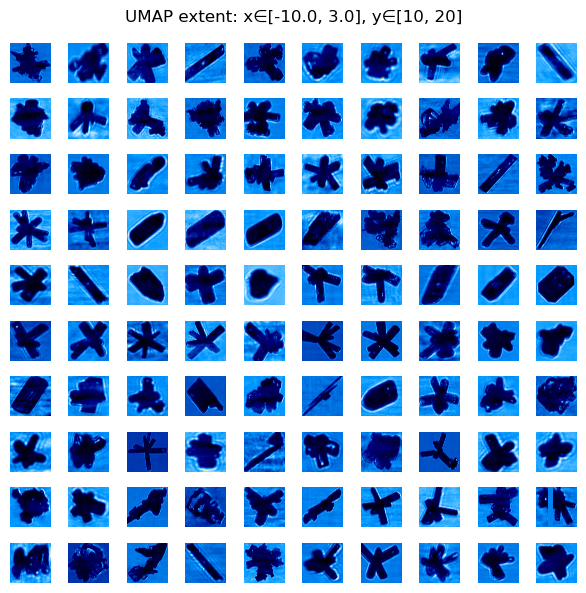

In [30]:
# Visualize based on specified extent 

# Show samples of CPI images within user-defined UMAP extent
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# -----------------------------
# Step 0: Define UMAP extent + parameters
# -----------------------------
cpi_base_dir = '/home/vanessa/hulk/cocpit/cpi_data/campaigns'

x_col, y_col = "umap_1", "umap_2"

x_min, x_max = -10.0, 3.0
y_min, y_max =  10,  20

n_samples = 100   # 10x10 grid

# -----------------------------
# Step 1: Filter df_sub_umap based on UMAP extent
# -----------------------------
df_filtered = df_sub_umap[
    (df_sub_umap[x_col] >= x_min) &
    (df_sub_umap[x_col] <= x_max) &
    (df_sub_umap[y_col] >= y_min) &
    (df_sub_umap[y_col] <= y_max)
]

print(f"Points in UMAP extent: {len(df_filtered)}")

# -----------------------------
# Step 2: Sample images
# -----------------------------
n_available = len(df_filtered)
n_take = min(n_samples, n_available)

df_sampled = df_filtered.sample(n=n_take, random_state=42)

# -----------------------------
# Step 3: Map campaigns to directory names
# -----------------------------
campaign_dir_map = {
    "CRYSTAL-FACE-NASA": "CRYSTAL_FACE_NASA",
    "CRYSTAL-FACE-UND": "CRYSTAL_FACE_UND",
    "ARM": "ARM",
    "MIDCIX": "MIDCIX",
    "MC3E": "MC3E",
    "OLYMPEX": "OLYMPEX"
}

# -----------------------------
# Step 4: Build image paths
# -----------------------------
image_paths = []
for _, row in df_sampled.iterrows():
    campaign_dir = campaign_dir_map.get(row["campaign"], row["campaign"])
    img_path = os.path.join(
        cpi_base_dir,
        campaign_dir,
        "single_imgs_v1.4.0",
        os.path.basename(row["filename"])
    )
    image_paths.append(img_path)

# -----------------------------
# Step 5: Load images
# -----------------------------
images = []
for path in image_paths:
    if os.path.exists(path):
        img = Image.open(path).convert("RGB")
        images.append(img)
    else:
        print(f"Warning: missing {path}")
        images.append(Image.new("RGB", (64, 64), (0, 0, 0)))

# -----------------------------
# Step 6: Plot images in a fixed 10x10 grid
# -----------------------------
grid_size = 10
fig, axes = plt.subplots(grid_size, grid_size, figsize=(6, 6))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < n_take:
        ax.imshow(images[i])
    ax.axis("off")

plt.suptitle(
    f"UMAP extent: x∈[{x_min}, {x_max}], y∈[{y_min}, {y_max}]",
    fontsize=12
)
plt.tight_layout()
plt.show()

## UMAP (3-D)

In [31]:
# using cls_features → UMAP 3D

import umap
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# -------------------------------
# Parameters
# -------------------------------
N_COMPONENTS = 3        # 3D UMAP
N = 500                # max samples per class
label_col = "classification"

umap_cols = ["umap_1", "umap_2", "umap_3"]

# -------------------------------
# Subsample first to reduce computation
# -------------------------------
dfs = []
for cls, group in df_merged.groupby(label_col):
    dfs.append(group.sample(n=min(len(group), N), random_state=42))

df_sub = pd.concat(dfs, ignore_index=True)
print(f"Subsampled DataFrame shape: {df_sub.shape}")

# -------------------------------
# Extract features as 2D array
# -------------------------------
X = np.vstack(df_sub["cls_features"].values).astype(np.float32)
print("Feature array shape (subsampled):", X.shape)

# -------------------------------
# Apply UMAP (3D)
# -------------------------------
umap_model = umap.UMAP(
    n_components=3,
    n_neighbors=100,
    min_dist=0.1,
    metric="cosine",
    n_jobs=-1,
    # random_state=42,
)

X_umap = umap_model.fit_transform(X)
print("UMAP-transformed shape:", X_umap.shape)

# -------------------------------
# Merge UMAP embedding back into DataFrame
# -------------------------------
df_sub_umap = df_sub.copy()
df_sub_umap[umap_cols] = X_umap

Subsampled DataFrame shape: (4134, 18)
Feature array shape (subsampled): (4134, 384)
UMAP-transformed shape: (4134, 3)


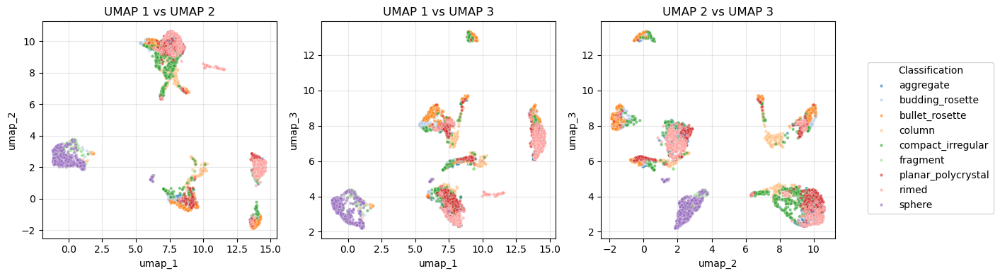

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex=False, sharey=False)

pairs = [
    ("umap_1", "umap_2", "UMAP 1 vs UMAP 2"),
    ("umap_1", "umap_3", "UMAP 1 vs UMAP 3"),
    ("umap_2", "umap_3", "UMAP 2 vs UMAP 3"),
]

for i, (ax, (x, y, title)) in enumerate(zip(axes, pairs)):
    sns.scatterplot(
        data=df_sub_umap,
        x=x,
        y=y,
        hue="classification",
        palette="tab20",
        s=10,
        alpha=0.6,
        legend=(i == 0),   # legend ONLY on first axis
        ax=ax
    )
    ax.set_title(title)
    ax.grid(alpha=0.3)

# move legend to the right
handles, labels = axes[0].get_legend_handles_labels()
axes[0].legend_.remove()  # remove in-axis legend

fig.legend(
    handles,
    labels,
    title="Classification",
    bbox_to_anchor=(1.02, 0.5),
    loc="center left"
)

plt.tight_layout()
plt.show()

# Mahalanobis Distance

In [41]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import mahalanobis

# Assume df_sub_umap['cls_features'] contains embeddings as np arrays
X = np.vstack(df_sub_umap['cls_features'].values)  # shape: (n_samples, n_features)
labels = df_sub_umap['classification'].values

# Prepare a dataframe to store distances
df_md = pd.DataFrame({'classification': labels})

# Compute class-wise mean and covariance
class_stats = {}
for cls in np.unique(labels):
    X_cls = X[labels == cls]
    mu = X_cls.mean(axis=0)
    cov = np.cov(X_cls, rowvar=False)
    # Add small regularization to avoid singular covariance
    cov += np.eye(cov.shape[0]) * 1e-5
    inv_cov = np.linalg.inv(cov)
    class_stats[cls] = {'mean': mu, 'inv_cov': inv_cov}

# Compute Mahalanobis distance of each point to its own class centroid
mdistances = []
for i, x in enumerate(X):
    cls = labels[i]
    mu = class_stats[cls]['mean']
    inv_cov = class_stats[cls]['inv_cov']
    md = mahalanobis(x, mu, inv_cov)
    mdistances.append(md)

df_md['mahalanobis_distance'] = mdistances


/tmp/tmp.F4DmjabItA/ipykernel_3851023/1769436984.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


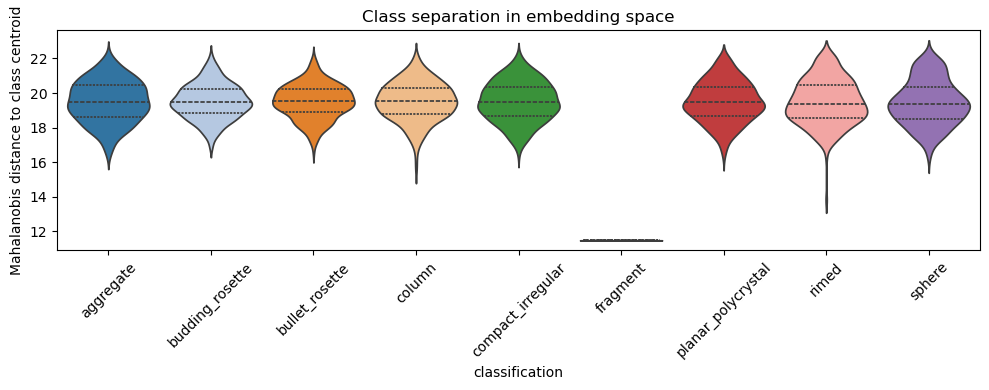

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
sns.violinplot(
    x='classification',
    y='mahalanobis_distance',
    data=df_md,
    inner='quartile',
    palette='tab20'
)
plt.xticks(rotation=45)
plt.ylabel('Mahalanobis distance to class centroid')
plt.title('Class separation in embedding space')
plt.tight_layout()
plt.show()

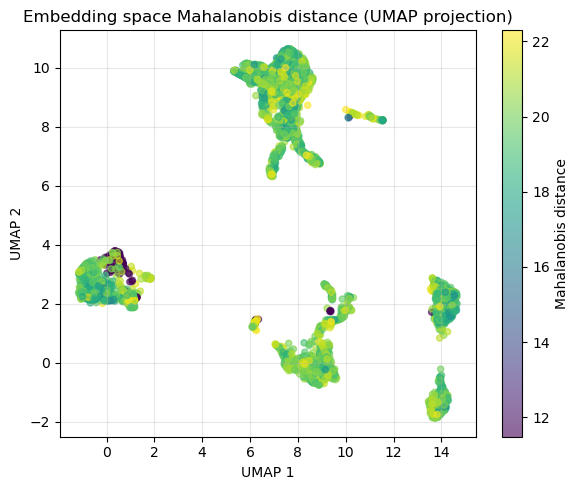

In [46]:
# If you already have 2D UMAP embeddings
df_plot = df_sub_umap
df_plot['mahalanobis_distance'] = df_md['mahalanobis_distance'].values
# Make sure df_plot contains 'umap_1', 'umap_2', 'mahalanobis_distance'
x = df_plot['umap_1'].values
y = df_plot['umap_2'].values
c = df_plot['mahalanobis_distance'].values

plt.figure(figsize=(6, 5))
sc = plt.scatter(x, y, c=c, cmap='viridis', s=20, alpha=0.6)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('Embedding space Mahalanobis distance (UMAP projection)')
plt.colorbar(sc, label='Mahalanobis distance')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# Linear classifier weights

In [64]:
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import pandas as pd

# -----------------------------
# Stack embeddings
# -----------------------------
X = np.vstack(df_merged['cls_features'].values)
y = df_merged['classification'].values

# Encode string labels to integers
le = LabelEncoder()
y_enc = le.fit_transform(y)

# -----------------------------
# Subsample N per class
# -----------------------------
df_tmp = pd.DataFrame({'X_idx': range(len(X)), 'y': y_enc})
subset_idx = []
N_samples = 200
for cls in np.unique(y_enc):
    cls_idx = df_tmp[df_tmp['y'] == cls]['X_idx'].values
    if len(cls_idx) > N_samples:
        cls_idx = np.random.choice(cls_idx, N_samples, replace=False)
    subset_idx.extend(cls_idx)

subset_idx = np.array(subset_idx)
X_sub = X[subset_idx]
y_sub = y_enc[subset_idx]

# -----------------------------
# Train/Test split
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_sub, y_sub, test_size=0.3, random_state=666, stratify=y_sub
)

# -----------------------------
# Scale embeddings
# -----------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------
# Train logistic regression
# -----------------------------
clf = LogisticRegression(
    solver='saga',       # fast for high-dimensional embeddings
    max_iter=2000,
    n_jobs=-1,
    random_state=666
)
clf.fit(X_train_scaled, y_train)

# -----------------------------
# Evaluate on test set
# -----------------------------
y_test_pred = clf.predict(X_test_scaled)
acc = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))

# -----------------------------
# Get weights, bias, and scores
# -----------------------------
weights = clf.coef_          # shape = (n_classes, n_features)
bias = clf.intercept_        # shape = (n_classes,)

# Score each test sample for each class (logits)
scores_test = X_test_scaled @ weights.T + bias

print(f"Scores shape: {scores_test.shape}")

Test Accuracy: 0.802

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.50      0.55        60
           1       0.68      0.77      0.72        60
           2       0.85      0.88      0.87        60
           3       0.91      0.85      0.88        60
           4       0.78      0.77      0.77        60
           5       0.85      0.95      0.90        41
           6       0.84      0.82      0.83        60
           7       0.76      0.80      0.78        60
           8       0.95      0.93      0.94        60

    accuracy                           0.80       521
   macro avg       0.80      0.81      0.80       521
weighted avg       0.80      0.80      0.80       521

Scores shape: (521, 9)


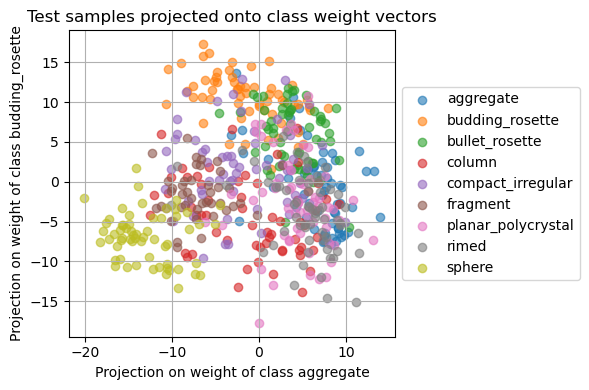

In [65]:
import matplotlib.pyplot as plt

# -----------------------------
# Choose two classes to visualize
# -----------------------------
classes_to_plot = [0, 1]  # pick any two classes
weight_vectors = weights[classes_to_plot]  # shape (2, n_features)

# Project test embeddings onto these two weight directions
proj_test = X_test_scaled @ weight_vectors.T  # shape (n_samples, 2)

# -----------------------------
# Plot projections
# -----------------------------
plt.figure(figsize=(6,4))
for c in np.unique(y_test):
    idx = y_test == c
    plt.scatter(
        proj_test[idx, 0], proj_test[idx, 1],
        label=le.inverse_transform([c])[0],  # convert integer back to original class name
        alpha=0.6
    )

plt.xlabel(f'Projection on weight of class {le.inverse_transform([classes_to_plot[0]])[0]}')
plt.ylabel(f'Projection on weight of class {le.inverse_transform([classes_to_plot[1]])[0]}')
plt.title('Test samples projected onto class weight vectors')
plt.grid(True)

# Move legend to the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()  # adjust layout so labels/legend fit
plt.show()

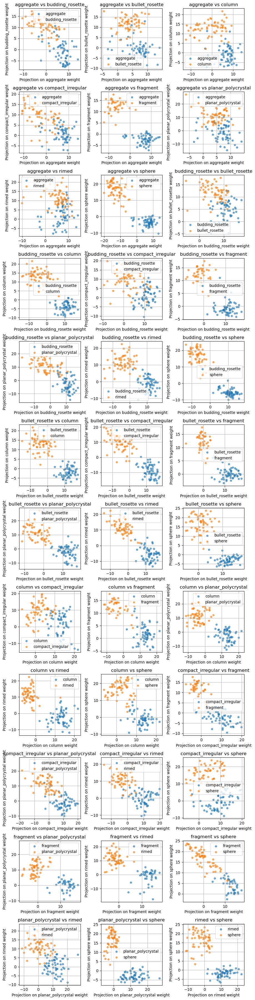

In [66]:
import matplotlib.pyplot as plt
from itertools import combinations

# -----------------------------
# All pairwise combinations of classes
# -----------------------------
class_indices = np.unique(y_test)
pairs = list(combinations(class_indices, 2))  # all pairs (i,j)

n_pairs = len(pairs)
n_cols = 3  # number of plots per row
n_rows = (n_pairs + n_cols - 1) // n_cols

plt.figure(figsize=(3 * n_cols, 3 * n_rows))

for i, (c1, c2) in enumerate(pairs):
    plt.subplot(n_rows, n_cols, i + 1)
    
    # Select weight vectors for this pair
    weight_vectors = weights[[c1, c2]]  # shape (2, n_features)
    
    # Project all test samples onto these two weight vectors
    proj_test = X_test_scaled @ weight_vectors.T  # shape (n_samples, 2)
    
    # Scatter plot only for the two classes
    for c in [c1, c2]:
        idx = y_test == c
        plt.scatter(
            proj_test[idx, 0], proj_test[idx, 1],
            alpha=0.6, s=20,
            label=le.inverse_transform([c])[0]
        )
    
    plt.xlabel(f'Projection on {le.inverse_transform([c1])[0]} weight')
    plt.ylabel(f'Projection on {le.inverse_transform([c2])[0]} weight')
    plt.title(f'{le.inverse_transform([c1])[0]} vs {le.inverse_transform([c2])[0]}')
    plt.grid(True)
    plt.legend(loc='best')  # legend on each subplot

plt.tight_layout()
plt.show()

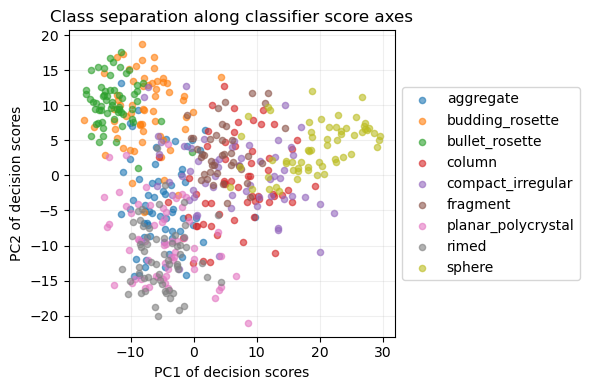

In [67]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# -----------------------------
# PCA on decision scores
# -----------------------------
pca_on_scores = PCA(n_components=2)
scores_2d = pca_on_scores.fit_transform(scores_test)  # use test scores

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(6, 4))
for cls in np.unique(y_test):
    mask = y_test == cls
    plt.scatter(
        scores_2d[mask, 0], scores_2d[mask, 1],
        s=20, alpha=0.6, label=le.inverse_transform([cls])[0]
    )

plt.xlabel('PC1 of decision scores')
plt.ylabel('PC2 of decision scores')
plt.title('Class separation along classifier score axes')
plt.grid(alpha=0.2)

# Legend outside right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# Feature based classifier (baseline)

In [101]:
# basic stats for merged df 
print(df_merged.shape)
samples_per_campaign = df_merged["classification"].value_counts()
print("\nNumber of samples per habit class:")
print(samples_per_campaign)

(937237, 20)

Number of samples per habit class:
classification
compact_irregular     505674
aggregate             180264
rimed                  80349
planar_polycrystal     72838
column                 35641
budding_rosette        32877
bullet_rosette         24667
sphere                  4793
fragment                 134
Name: count, dtype: int64


In [102]:
# subsample N per class (fragments may be undersamples)
N = 1000  # number of samples per class
df_sub = df_merged.groupby('classification', group_keys=False).apply(
    lambda x: x.sample(min(len(x), N), random_state=666)
).reset_index(drop=True)
print(df_sub['classification'].value_counts())

classification
aggregate             1000
budding_rosette       1000
bullet_rosette        1000
column                1000
compact_irregular     1000
planar_polycrystal    1000
rimed                 1000
sphere                1000
fragment               134
Name: count, dtype: int64


/tmp/tmp.F4DmjabItA/ipykernel_3851023/374312761.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sub = df_merged.groupby('classification', group_keys=False).apply(


In [103]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# -----------------------------
# Manual features
# -----------------------------
manual_features = [
    'blur', 'contrast', 'circularity', 'solidity', 'complexity', 
    'equiv_d', 'phi', 'extreme_points', 'filled_circular_area_ratio', 
    'roundness', 'perim_area_ratio', 'particle_width', 'particle_height'
]

X = df_sub[manual_features].values
y = df_sub['classification'].values

# -----------------------------
# Encode labels
# -----------------------------
le = LabelEncoder()
y_enc = le.fit_transform(y)

# -----------------------------
# Train/test split
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc, test_size=0.3, random_state=666, stratify=y_enc
)

# -----------------------------
# Optional: scale features
# -----------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------
# Train linear classifier
# -----------------------------
clf = LogisticRegression(
    solver='saga',      # fast for high-dimensional data (even 11 features is fine)
    max_iter=1000,
    n_jobs=-1,
    random_state=666
)
clf.fit(X_train_scaled, y_train)

# -----------------------------
# Evaluate
# -----------------------------
y_test_pred = clf.predict(X_test_scaled)
acc = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_test_pred, target_names=le.classes_))

# -----------------------------
# Get weights, bias, and scores
# -----------------------------
weights = clf.coef_          # shape = (n_classes, n_features)
bias = clf.intercept_        # shape = (n_classes,)

# Score each test sample for each class (logits)
scores_test = X_test_scaled @ weights.T + bias
print(f"Scores shape: {scores_test.shape}")

Test Accuracy: 0.574

Classification Report:
                     precision    recall  f1-score   support

         aggregate       0.43      0.22      0.29       300
   budding_rosette       0.53      0.66      0.59       300
    bullet_rosette       0.65      0.66      0.66       300
            column       0.67      0.60      0.63       300
 compact_irregular       0.48      0.60      0.54       300
          fragment       0.70      0.80      0.75        41
planar_polycrystal       0.41      0.39      0.40       300
             rimed       0.41      0.45      0.43       300
            sphere       0.95      0.98      0.96       300

          accuracy                           0.57      2441
         macro avg       0.58      0.60      0.58      2441
      weighted avg       0.57      0.57      0.56      2441

Scores shape: (2441, 9)


/home/jko/miniconda3/envs/torch/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


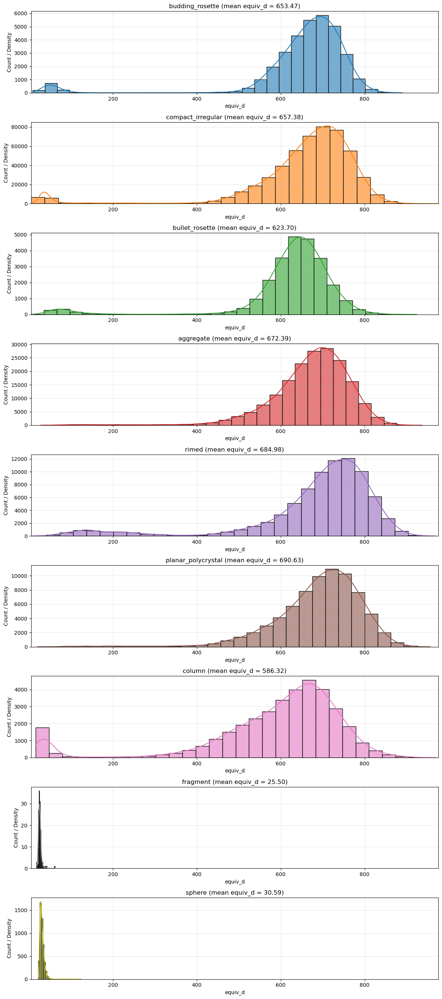

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

df = df_merged
classes = df['classification'].unique()
n_classes = len(classes)

# Generate a palette of colors
palette = sns.color_palette("tab10", n_classes)

# Determine the x-axis range across all classes
x_min = df['equiv_d'].min()
x_max = df['equiv_d'].max()

# -----------------------------
# Create subplots: 1 column, n_classes rows
# -----------------------------
fig, axes = plt.subplots(n_classes, 1, figsize=(12, 3*n_classes))  # width:12, height:3 per subplot

for i, cls in enumerate(classes):
    subset = df[df['classification'] == cls]
    mean_val = subset['equiv_d'].mean()  # compute mean
    
    sns.histplot(
        subset['equiv_d'],
        bins=30,
        kde=True,
        ax=axes[i],
        color=palette[i],
        alpha=0.6
    )
    axes[i].set_title(f'{cls} (mean equiv_d = {mean_val:.2f})')  # include mean in title
    axes[i].set_xlabel('equiv_d')
    axes[i].set_ylabel('Count / Density')
    axes[i].set_xlim(x_min, x_max)  # fix x-axis
    axes[i].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Compare budding to bullet rosettes

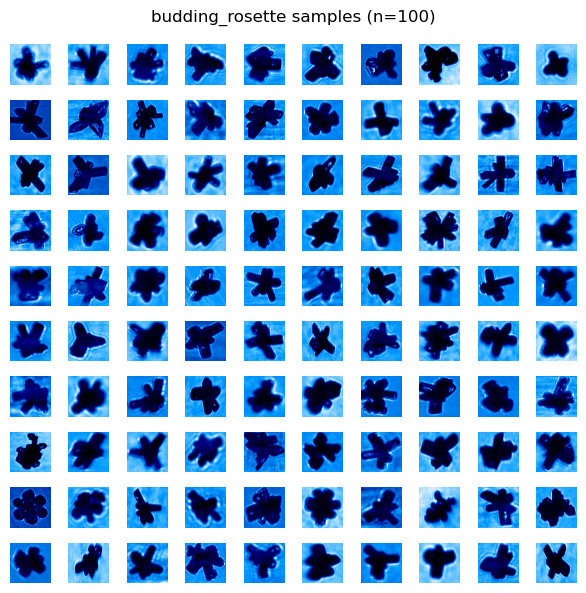

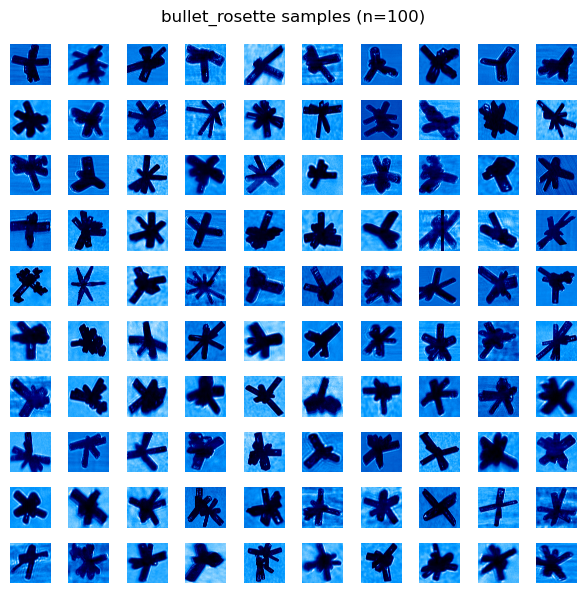

In [81]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# -----------------------------
# Parameters
# -----------------------------
cpi_base_dir = '/home/vanessa/hulk/cocpit/cpi_data/campaigns'
manual_classes = ["budding_rosette", "bullet_rosette"]
n_samples = 100  # 10x10 grid
grid_size = 10

campaign_dir_map = {
    "CRYSTAL-FACE-NASA": "CRYSTAL_FACE_NASA",
    "CRYSTAL-FACE-UND": "CRYSTAL_FACE_UND",
    "ARM": "ARM",
    "MIDCIX": "MIDCIX",
    "MC3E": "MC3E",
    "OLYMPEX": "OLYMPEX"
}

# -----------------------------
# Function to sample images for a given class
# -----------------------------
def sample_and_plot_images(df, class_name):
    df_class = df[df['classification'] == class_name]
    df_sampled = df_class.sample(n=min(n_samples, len(df_class)), random_state=42)

    images = []
    for _, row in df_sampled.iterrows():
        campaign_dir = campaign_dir_map.get(row["campaign"], row["campaign"])
        img_path = os.path.join(
            cpi_base_dir,
            campaign_dir,
            "single_imgs_v1.4.0",
            os.path.basename(row["filename"])
        )
        if os.path.exists(img_path):
            img = Image.open(img_path).convert("RGB")
            images.append(img)
        else:
            print(f"Warning: missing {img_path}")
            images.append(Image.new("RGB", (64, 64), (0, 0, 0)))  # placeholder

    # Plot 10x10 grid
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(6, 6))
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis("off")
    plt.suptitle(f"{class_name} samples (n={len(images)})", fontsize=12)
    plt.tight_layout()
    plt.show()

# -----------------------------
# Plot for each class
# -----------------------------
for cls in manual_classes:
    sample_and_plot_images(df_merged, cls)

# Particle size check

Is equiv_d the proper size metric? Double check with other size metrics.

In [86]:
# compare particle width and particle height distributions vs. equiv_d

# Check which campaigns have particle width and particle height as features 
data_dir = '/home/jko/cocpit/final_databases/vgg16/jk-modified'
features_to_check = ['particle width', 'particle height', 'equiv_d']

# -----------------------------
# Find all CSV files
# -----------------------------
csv_files = list(Path(data_dir).glob('*.csv'))
if not csv_files:
    raise FileNotFoundError(f"No CSV files found in {data_dir}")


# -----------------------------
# Check which CSVs contain the features (robust to slight variations)
# -----------------------------
files_with_features = []
files_missing_features = []

for f in csv_files:
    cols = [c.lower() for c in pd.read_csv(f, nrows=0).columns]  # lowercase for robust match
    has_all_features = all(any(feat in c for c in cols) for feat in features_to_check)
    if has_all_features:
        files_with_features.append(f.name)
    else:
        files_missing_features.append(f.name)

# -----------------------------
# Print results
# -----------------------------
print(f"CSV files containing {features_to_check}:")
for fname in files_with_features:
    print(f" - {fname}")

print(f"\nCSV files MISSING {features_to_check}:")
for fname in files_missing_features:
    print(f" - {fname}")

CSV files containing ['particle width', 'particle height', 'equiv_d']:
 - ATTREX.csv
 - OLYMPEX.csv
 - MPACE.csv
 - ICE_L.csv
 - AIRS_II.csv
 - CRYSTAL_FACE_NASA.csv
 - IPHEX.csv
 - POSIDON.csv
 - MACPEX.csv
 - CRYSTAL_FACE_UND.csv
 - MC3E.csv
 - ARM.csv
 - ISDAC.csv
 - ESCAPE.csv
 - MIDCIX.csv

CSV files MISSING ['particle width', 'particle height', 'equiv_d']:


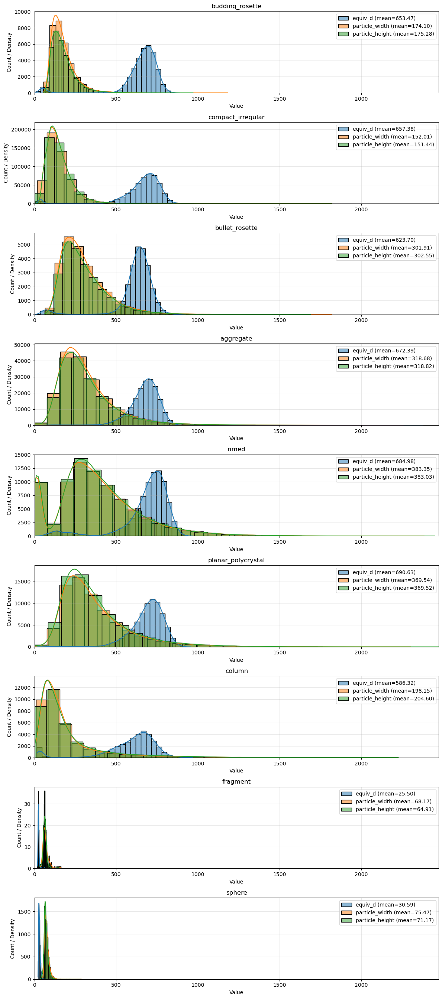

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

df = df_merged
classes = df['classification'].unique()
n_classes = len(classes)

# -----------------------------
# Define colors for the three features
# -----------------------------
feature_cols = ['equiv_d', 'particle_width', 'particle_height']
feature_colors = ['tab:blue', 'tab:orange', 'tab:green']

# Determine the overall x-axis range across all three features
x_min = min(df['equiv_d'].min(), df['particle_width'].min(), df['particle_height'].min())
x_max = max(df['equiv_d'].max(), df['particle_width'].max(), df['particle_height'].max())

# -----------------------------
# Create subplots
# -----------------------------
fig, axes = plt.subplots(n_classes, 1, figsize=(12, 3*n_classes))  # width:12, height:3 per subplot

for i, cls in enumerate(classes):
    subset = df[df['classification'] == cls]
    
    # Plot each feature
    for feat, color in zip(feature_cols, feature_colors):
        mean_val = subset[feat].mean()
        sns.histplot(
            subset[feat],
            bins=30,
            kde=True,
            ax=axes[i],
            color=color,
            alpha=0.5,
            label=f'{feat} (mean={mean_val:.2f})'
        )
    
    axes[i].set_title(f'{cls}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Count / Density')
    axes[i].set_xlim(x_min, x_max)  # same x-axis for all
    axes[i].grid(alpha=0.3)
    axes[i].legend()

plt.tight_layout()
plt.show()

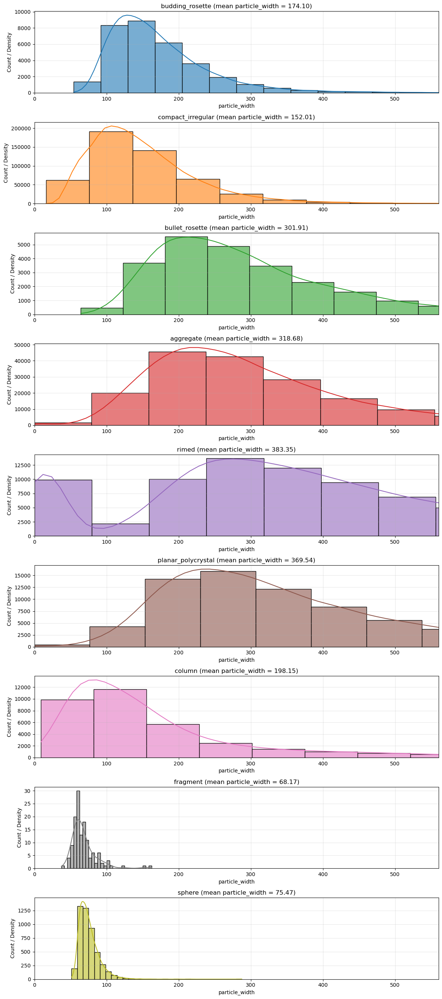

In [106]:
# particle width/height is a better indicator of actual size 
# Plot particle width (height is similar)

import matplotlib.pyplot as plt
import seaborn as sns

df = df_merged
classes = df['classification'].unique()
n_classes = len(classes)

# Generate a palette of colors
palette = sns.color_palette("tab10", n_classes)

# Determine the x-axis range across all classes
x_min = df['particle_width'].min()
x_max = df['particle_width'].quantile(0.95)  # 90th percentile

# -----------------------------
# Create subplots: 1 column, n_classes rows
# -----------------------------
fig, axes = plt.subplots(n_classes, 1, figsize=(12, 3*n_classes))  # width:12, height:3 per subplot

for i, cls in enumerate(classes):
    subset = df[df['classification'] == cls]
    mean_val = subset['particle_width'].mean()  # compute mean
    
    sns.histplot(
        subset['particle_width'],
        bins=30,
        kde=True,
        ax=axes[i],
        color=palette[i],
        alpha=0.6
    )
    axes[i].set_title(f'{cls} (mean particle_width = {mean_val:.2f})')  # include mean in title
    axes[i].set_xlabel('particle_width')
    axes[i].set_ylabel('Count / Density')
    axes[i].set_xlim(x_min, x_max)  # fix x-axis
    axes[i].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Classifier w/ Embeddings + features 

Does adding manual features to the embeddings help with the classification?

In [107]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# -----------------------------
# Manual features
# -----------------------------
manual_features = [
    'blur', 'contrast', 'circularity', 'solidity', 'complexity', 
    'equiv_d', 'phi', 'extreme_points', 'filled_circular_area_ratio', 
    'roundness', 'perim_area_ratio', 'particle_width', 'particle_height'
]

# -----------------------------
# Stack embeddings and manual features
# -----------------------------
X_embed = np.vstack(df_sub['cls_features'].values)       # embeddings
X_manual = df_sub[manual_features].values                # manual features

# Concatenate features along last axis
X = np.hstack([X_embed, X_manual])
y = df_sub['classification'].values

# -----------------------------
# Encode labels
# -----------------------------
le = LabelEncoder()
y_enc = le.fit_transform(y)

# -----------------------------
# Subsample N per class
# -----------------------------
df_tmp = pd.DataFrame({'X_idx': np.arange(len(X)), 'y': y_enc})
subset_idx = []
N_samples = 200
for cls in np.unique(y_enc):
    cls_idx = df_tmp[df_tmp['y'] == cls]['X_idx'].values
    if len(cls_idx) > N_samples:
        cls_idx = np.random.choice(cls_idx, N_samples, replace=False)
    subset_idx.extend(cls_idx)

subset_idx = np.array(subset_idx)
X_sub = X[subset_idx]
y_sub = y_enc[subset_idx]

# -----------------------------
# Train/test split
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_sub, y_sub, test_size=0.3, random_state=666, stratify=y_sub
)

# -----------------------------
# Scale features
# -----------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------
# Train linear classifier
# -----------------------------
clf = LogisticRegression(
    solver='saga',       # good for high-dimensional data
    max_iter=2000,
    n_jobs=-1,
    random_state=666
)
clf.fit(X_train_scaled, y_train)

# -----------------------------
# Evaluate
# -----------------------------
y_test_pred = clf.predict(X_test_scaled)
acc = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_test_pred, target_names=le.classes_))

Test Accuracy: 0.818

Classification Report:
                     precision    recall  f1-score   support

         aggregate       0.63      0.65      0.64        60
   budding_rosette       0.78      0.78      0.78        60
    bullet_rosette       0.86      0.85      0.86        60
            column       0.88      0.87      0.87        60
 compact_irregular       0.75      0.77      0.76        60
          fragment       0.93      0.93      0.93        41
planar_polycrystal       0.79      0.82      0.80        60
             rimed       0.82      0.78      0.80        60
            sphere       0.95      0.95      0.95        60

          accuracy                           0.82       521
         macro avg       0.82      0.82      0.82       521
      weighted avg       0.82      0.82      0.82       521



In [108]:
# What if I just add size (particle width)?
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# -----------------------------
# Only add particle_width as manual feature
# -----------------------------
manual_features = ['particle_width']

# -----------------------------
# Stack embeddings and selected manual feature
# -----------------------------
X_embed = np.vstack(df_sub['cls_features'].values)       # embeddings
X_manual = df_sub[manual_features].values                # only particle_width

# Concatenate embeddings and particle_width
X = np.hstack([X_embed, X_manual])
y = df_sub['classification'].values

# -----------------------------
# Encode labels
# -----------------------------
le = LabelEncoder()
y_enc = le.fit_transform(y)

# -----------------------------
# Subsample N per class
# -----------------------------
df_tmp = pd.DataFrame({'X_idx': np.arange(len(X)), 'y': y_enc})
subset_idx = []
N_samples = 200
for cls in np.unique(y_enc):
    cls_idx = df_tmp[df_tmp['y'] == cls]['X_idx'].values
    if len(cls_idx) > N_samples:
        cls_idx = np.random.choice(cls_idx, N_samples, replace=False)
    subset_idx.extend(cls_idx)

subset_idx = np.array(subset_idx)
X_sub = X[subset_idx]
y_sub = y_enc[subset_idx]

# -----------------------------
# Train/test split
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_sub, y_sub, test_size=0.3, random_state=666, stratify=y_sub
)

# -----------------------------
# Scale features
# -----------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------
# Train linear classifier
# -----------------------------
clf = LogisticRegression(
    solver='saga',       # good for high-dimensional data
    max_iter=2000,
    n_jobs=-1,
    random_state=666
)
clf.fit(X_train_scaled, y_train)

# -----------------------------
# Evaluate
# -----------------------------
y_test_pred = clf.predict(X_test_scaled)
acc = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:\n", classification_report(y_test, y_test_pred, target_names=le.classes_))

# -----------------------------
# Get weights, bias, and scores
# -----------------------------
weights = clf.coef_          # shape = (n_classes, n_features)
bias = clf.intercept_        # shape = (n_classes,)
scores_test = X_test_scaled @ weights.T + bias
print(f"Scores shape: {scores_test.shape}")

Test Accuracy: 0.820

Classification Report:
                     precision    recall  f1-score   support

         aggregate       0.57      0.60      0.59        60
   budding_rosette       0.86      0.82      0.84        60
    bullet_rosette       0.96      0.88      0.92        60
            column       0.89      0.95      0.92        60
 compact_irregular       0.75      0.68      0.71        60
          fragment       0.97      0.90      0.94        41
planar_polycrystal       0.78      0.78      0.78        60
             rimed       0.72      0.82      0.77        60
            sphere       0.95      0.97      0.96        60

          accuracy                           0.82       521
         macro avg       0.83      0.82      0.82       521
      weighted avg       0.82      0.82      0.82       521

Scores shape: (521, 9)
